In [48]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

%matplotlib inline

In [49]:
a, b, c, d = 63, 63+64, 63+2*64, 63+3*64

first = np.array([[a, b], [d, c]])
second = np.array([[b, c], [a, d]])
third = np.array([[c, d], [b, a]])
fourth = np.array([[d, a], [c, b]])

video = np.array([first, second, third, fourth]*10)

<IPython.core.display.Javascript object>


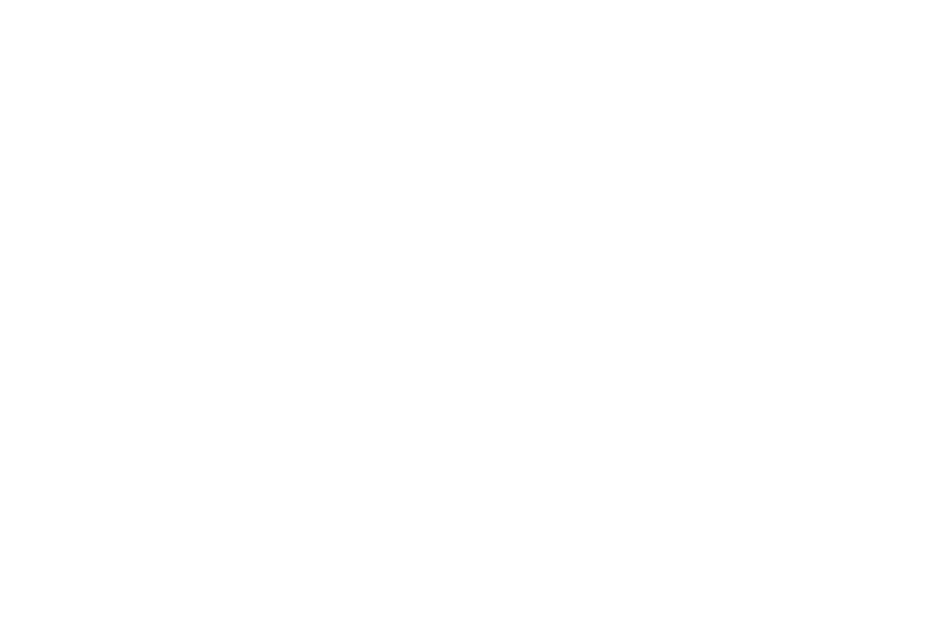

<IPython.core.display.Javascript object>


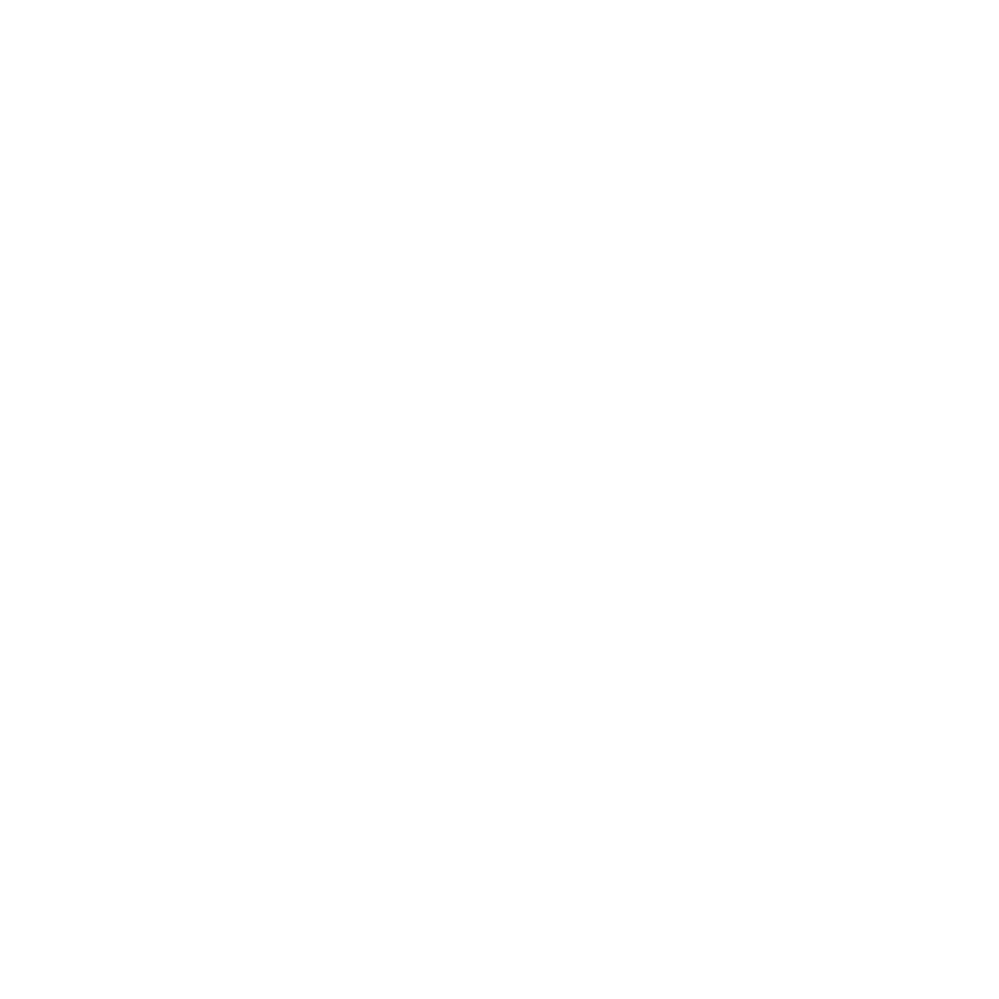

<IPython.core.display.Javascript object>


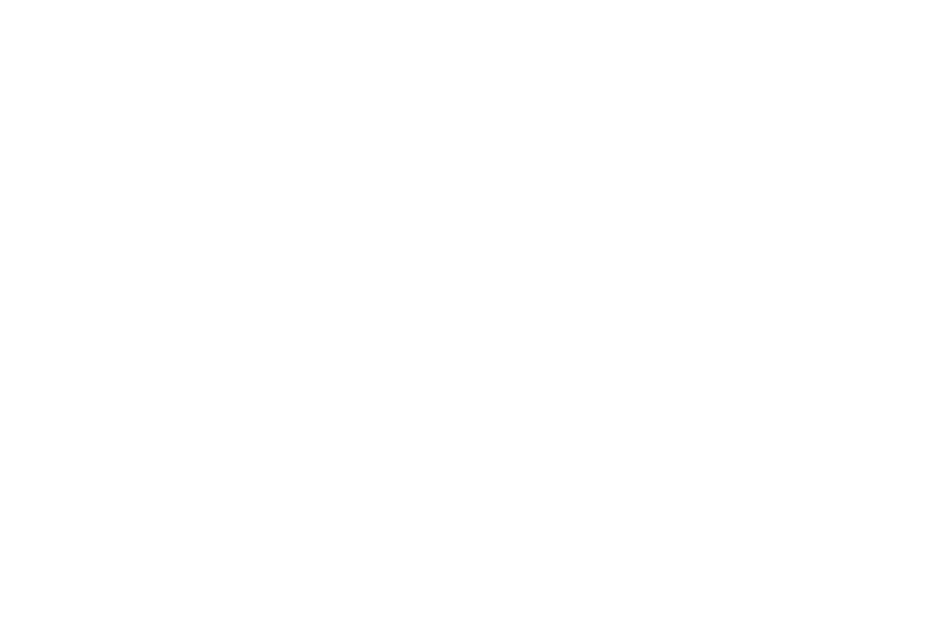

<IPython.core.display.Javascript object>


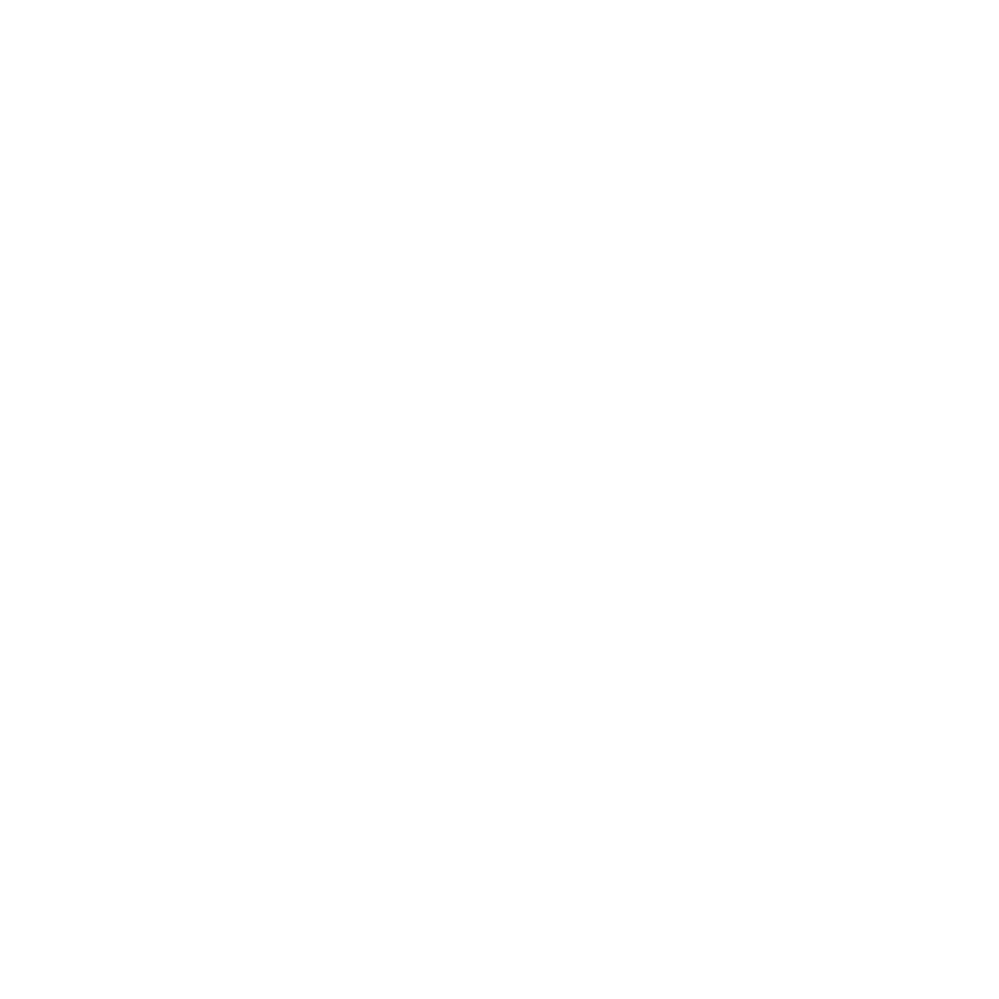

In [50]:
# def updatefig(*args):
#     global x,y
#     x += np.pi / 15.
#     y += np.pi / 20.
#     im.set_array(f(x,y))
#     return im,

# plt.ion()
%matplotlib notebook
# for i in range(1, 9):
# #     plt.subplot(1, 8, i)
# #     ax.set_cmap('binary')
# #     plt.clf()
#     plt.axis('off')
#     plt.imshow(video[i], cmap='binary')
# #     plt.draw()
# #     plt.gcf().canvas.flush_events()
#     plt.pause(1)
    
# # plt.ioff()
# plt.show()

def init():
    plt.set_cmap('binary')
    plt.axis('off')
    return ln,

def update(frame):
#     xdata.append(frame)
#     ydata.append(np.sin(frame))
    ln.set_data(frame)
    return ln,

ln = plt.imshow(video[0])
fig = plt.figure(figsize=(10, 10))
ani = FuncAnimation(fig, update, frames=video,
                    init_func=init, repeat=True, repeat_delay=500, interval=500)
plt.show()

In [51]:
from hottbox.core import Tensor
from hottbox.algorithms.decomposition import TTSVD, HOSVD, HOOI, CPD
from hottbox.metrics import residual_rel_error

In [54]:
video_reshaped = video.reshape((40, 4))

In [117]:
L = 4
N = video.shape[0]-L+1
# traj_tensor = np.zeros((2, 2, N, L))
traj_tensor = np.zeros((4, N, L))

# for i in range(2):
#     for j in range(2):
#         series = video[:, i, j]
#         traj_matr = np.zeros((N, L))
#         for n in range(N):
#             traj_matr[n] = series[n:n+L]
#         traj_tensor[i, j] = traj_matr

for i in range(4):
    series = video_reshaped[:, i]
    traj_matr = np.zeros((N, L))
    for n in range(N):
        traj_matr[n] = series[n:n+L]
    traj_tensor[i] = traj_matr

In [118]:
traj_tensor.shape

(4, 37, 4)

In [119]:
alg = HOSVD()
alg

HOSVD(process=(), verbose=False)

In [120]:
tensor = Tensor(traj_tensor)
print(tensor)

This tensor is of order 3 and consists of 592 elements.
Sizes and names of its modes are (4, 37, 4) and ['mode-0', 'mode-1', 'mode-2'] respectively.


In [186]:
ml_rank = (3, 3, 3)
tensor_tkd_hosvd = alg.decompose(tensor, ml_rank)
print("\tOutput of the {} algorithm:".format(alg.name))
print(tensor_tkd_hosvd)

print('\n\tFactor matrices')
for mode, fmat in enumerate(tensor_tkd_hosvd.fmat):
    print('Mode-{} factor matrix is of shape {}'.format(mode, fmat.shape))
    
print('\n\tCore tensor')
print(tensor_tkd_hosvd.core)

	Output of the HOSVD algorithm:
Tucker representation of a tensor with multi-linear rank=(3, 3, 3).
Factor matrices represent properties: ['mode-0', 'mode-1', 'mode-2']
With corresponding latent components described by (33936, 42, 9) features respectively.

	Factor matrices
Mode-0 factor matrix is of shape (33936, 3)
Mode-1 factor matrix is of shape (42, 3)
Mode-2 factor matrix is of shape (9, 3)

	Core tensor
This tensor is of order 3 and consists of 27 elements.
Sizes and names of its modes are (3, 3, 3) and ['mode-0', 'mode-1', 'mode-2'] respectively.


In [122]:
data = tensor_tkd_hosvd.reconstruct()

In [62]:
data = data.data

In [ ]:
core_tensor = tensor_tkd_hosvd.core.data
fmat_0 = tensor_tkd_hosvd.fmat[0]
fmat_1 = tensor_tkd_hosvd.fmat[1]
fmat_2 = tensor_tkd_hosvd.fmat[2]

In [125]:
import matplotlib.pylab as plt
import matplotlib.cm as cm

%matplotlib inline
plt.rcParams['figure.figsize']=(12,9)
plt.rcParams['font.size']= 30

In [126]:
from matplotlib import pylab as plt
plt.rcParams['font.family'] = 'DejaVu Serif'
plt.rcParams['lines.linewidth'] = 2
plt.rcParams['lines.markersize'] = 12
plt.rcParams['xtick.labelsize'] = 24
plt.rcParams['ytick.labelsize'] = 24
plt.rcParams['legend.fontsize'] = 24
plt.rcParams['axes.titlesize'] = 36
plt.rcParams['axes.labelsize'] = 24

In [127]:
from mpl_toolkits.mplot3d.axes3d import Axes3D
from mpl_toolkits.mplot3d.proj3d import proj_transform
from matplotlib.patches import FancyArrowPatch

<IPython.core.display.Javascript object>


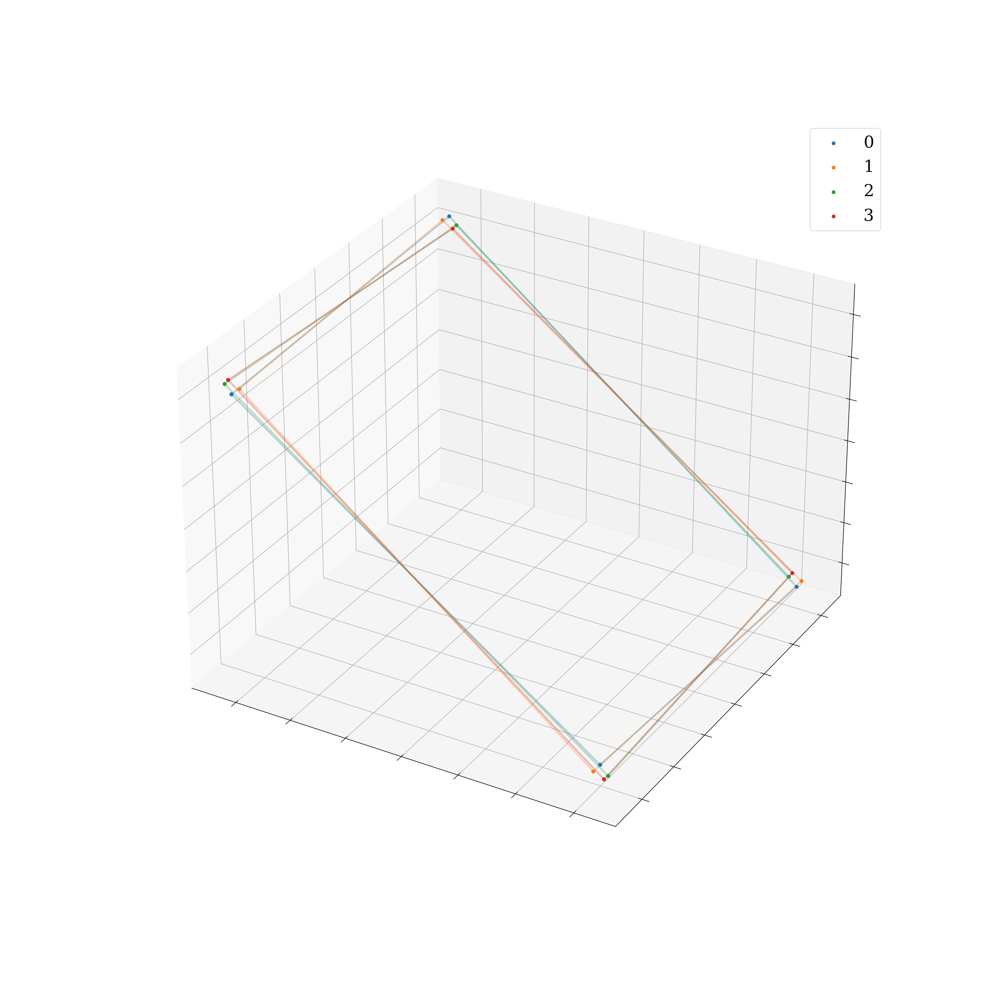

In [135]:
%matplotlib notebook

fig = plt.figure(figsize=(20, 20))
ax = plt.axes(projection='3d')

# ax.plot3D(par1, par2, np.array(val) * 1.5, linewidth=6, label='Metaparameter optimization', alpha=0.5)
# ax.plot3D([par1_[0], par1_[0]+0.0001], [par2_[0], par2_[0]+0.0001], 
#           [val_[0], val_[0]+0.0001], linewidth=6.5, 
#           label='Metaprameter prediction', color='tab:orange', ls='--')

# for i in range(2):
#     for j in range(2):
#         ax.scatter3D(data[i, j, :, 0], data[i, j, :, 1], data[i, j, :, 3], 
#                      label='{}, {}'.format(i, j))

# for i in range(4):
#     if i % 2 == 0:
#         ax.scatter3D(data[i, :, 0], data[i, :, 1], data[i, :, 2], 
#                      label='{}'.format(i), marker='o')
#         ax.plot(data[i, :, 0], data[i, :, 1], data[i, :, 2], alpha=0.3)
#     else:
#         ax.scatter3D(data[i, :, 1], data[i, :, 2], data[i, :, 3], 
#              label='{}'.format(i), marker='o')
#         ax.plot(data[i, :, 1], data[i, :, 2], data[i, :, 3], alpha=0.3)

for i in range(zeroed.shape[0]):
        ax.scatter3D(data[i, :, 1], data[i, :, 2], data[i, :, 3], 
                     label='{}'.format(i), marker='o')
        ax.plot(data[i, :, 1], data[i, :, 2], data[i, :, 3], 
                alpha=0.3)

ax.legend(loc='best')
ax.set_yticklabels([])
ax.set_xticklabels([])
ax.set_zticklabels([])
plt.savefig('./figs/trajectories_base.pdf')
plt.show()

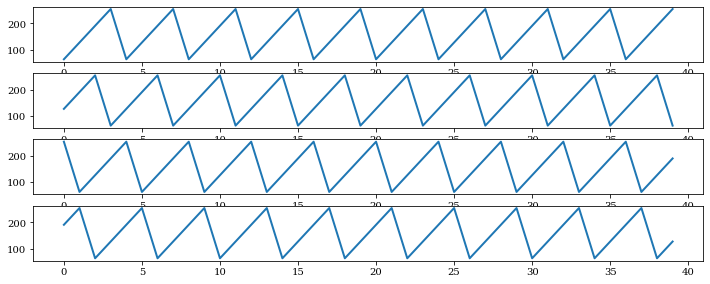

In [116]:
# for i in range(4):
#     plt.plot(video_reshaped[:, i], label='initial')
# #     plt.plot(pred[:, i], label='predicted')
#     plt.show()
    
# from random import randint

plt.rcParams['figure.figsize']=(12,12)
plt.rcParams['font.size']= 30

plt.rcParams['font.family'] = 'DejaVu Serif'
plt.rcParams['lines.linewidth'] = 2
plt.rcParams['lines.markersize'] = 12
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
plt.rcParams['legend.fontsize'] = 24
plt.rcParams['axes.titlesize'] = 36
plt.rcParams['axes.labelsize'] = 24

for i in range(4):
    plt.subplot(10, 1, i+1)
    plt.plot(video_reshaped[:, i])
plt.savefig('example_series_base.png')
plt.show()

# for n in range(3):
#     i = randint(0, 201)
#     j = randint(0, 167)
#     plt.subplot(10, 1, n+1)
#     plt.plot(frames_np[:, i, j])
# plt.savefig('./figs/example_series_mario.png')
# plt.show()

In [77]:
ttr = Tensor(traj_tensor)

In [78]:
ttr

This tensor is of order 3 and consists of 592 elements.
Sizes and names of its modes are (4, 37, 4) and ['mode-0', 'mode-1', 'mode-2'] respectively.

In [ ]:
unfolds = []
for i in range(len(ttr.shape)):
    unfolds.append(ttr.unfold(mode=i, inplace=False))

In [ ]:
unfolds[0].data

In [180]:
from pyts.decomposition import SingularSpectrumAnalysis

groups = 3
L = 4
alg_2 = SingularSpectrumAnalysis(L, groups)
alg_2.fit(video_reshaped.T)
res = alg_2.transform(video_reshaped.T)

In [181]:
res.shape

(4, 3, 40)

<IPython.core.display.Javascript object>


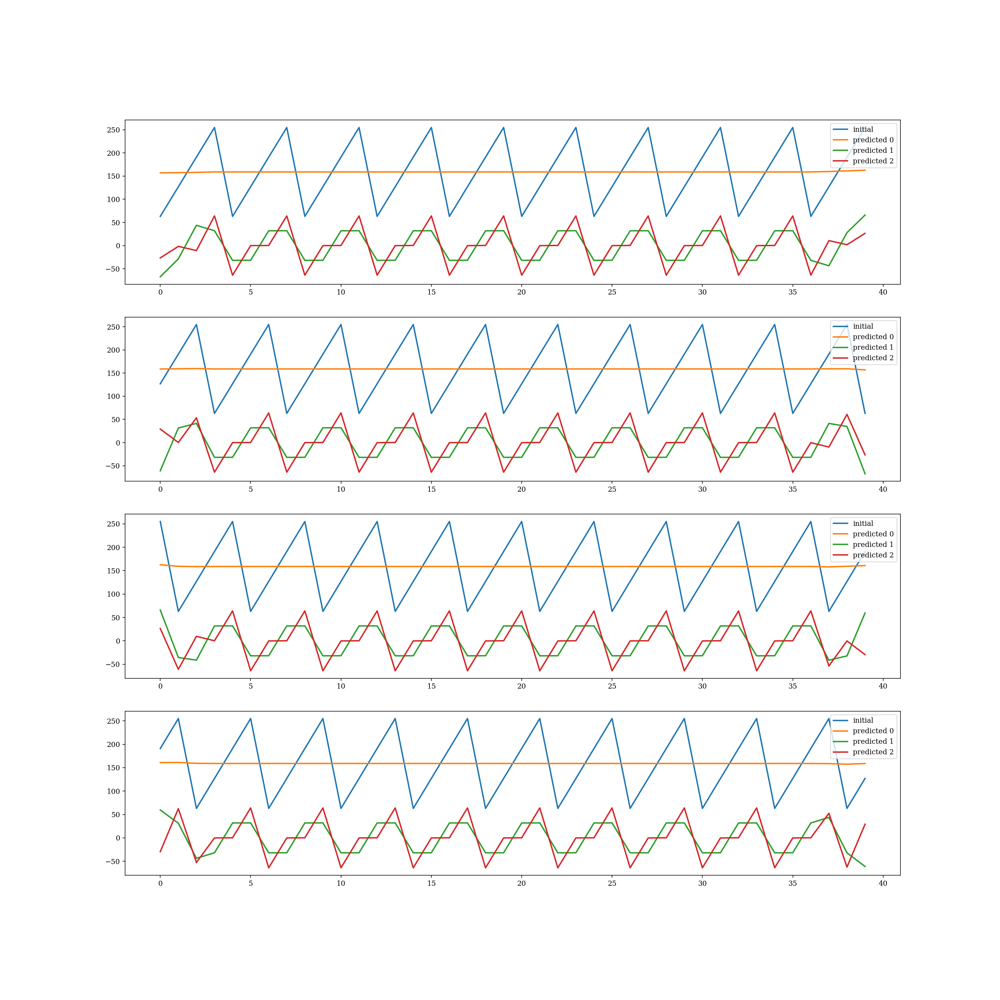

In [185]:
plt.rcParams['figure.figsize']=(9,9)
plt.rcParams['font.size']= 30

plt.rcParams['font.family'] = 'DejaVu Serif'
plt.rcParams['lines.linewidth'] = 2
plt.rcParams['lines.markersize'] = 12
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
plt.rcParams['legend.fontsize'] = 10
plt.rcParams['axes.titlesize'] = 36
plt.rcParams['axes.labelsize'] = 24

preds = np.zeros_like(video_reshaped)
for i in range(4):
    plt.subplot(4, 1, i+1)
    plt.plot(video_reshaped[:, i], label='initial')
#     plt.plot(pred[:, i], label='predicted')
    pred = np.zeros_like(res[i, 0, :])
    for j in range(3):
        plt.plot(res[i, j, :], label='predicted {}'.format(j))
        pred += res[i, j, :]
#     plt.plot(pred, label='predicted')
    preds[:, i] = pred
#     plt.plot(res[i, :], label='predicted')
    plt.legend(loc='upper right')
plt.savefig('ssa_base.pdf')
plt.show()
    

# for i in range(4):
#     plt.subplot(10, 1, i+1)
#     plt.plot(video_reshaped[:, i])
# plt.savefig('example_series_base.png')
# plt.show()    

In [81]:
import pickle
import cv2

frames = []
source = './mario.mp4'
cap = cv2.VideoCapture(source)
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break
    grayscaled = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    frames.append(grayscaled)
#     pickle.loads(cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY).dumps())
cap.release()

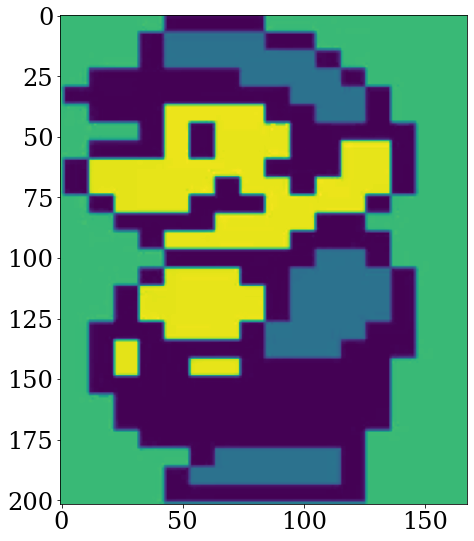

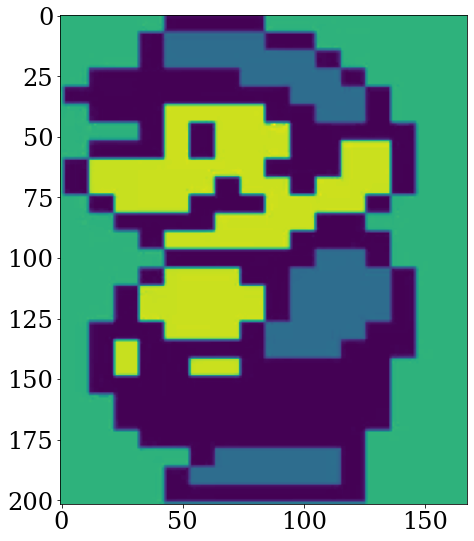

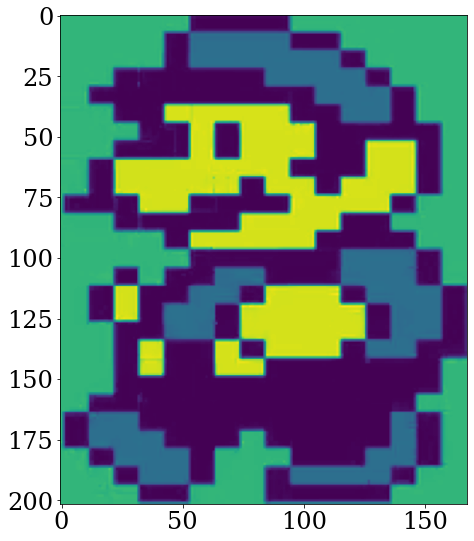

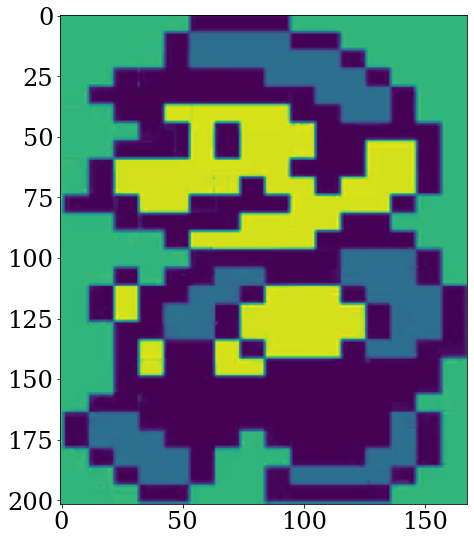

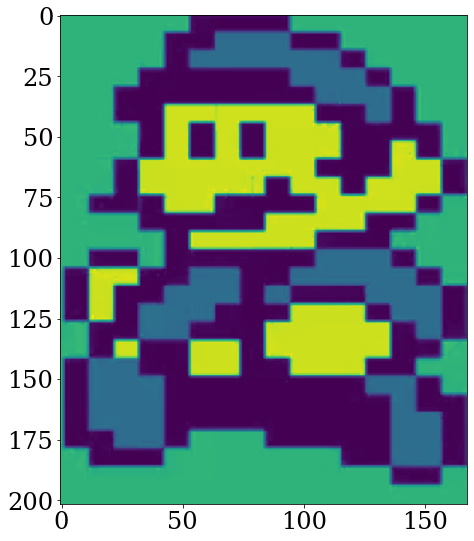

...

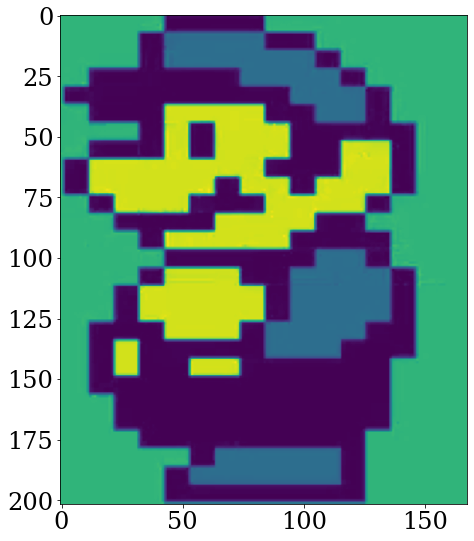

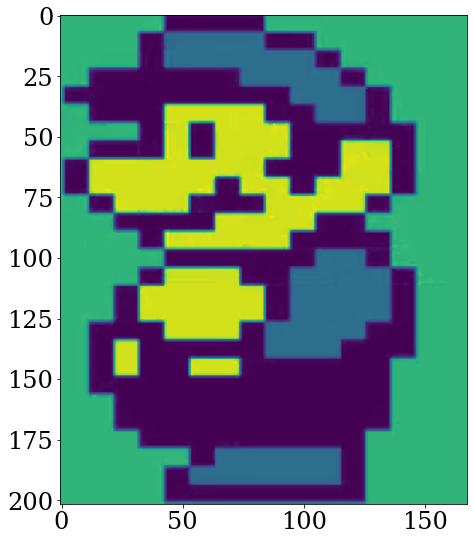

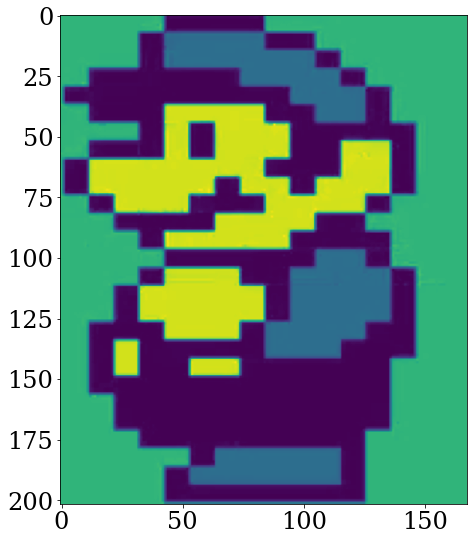

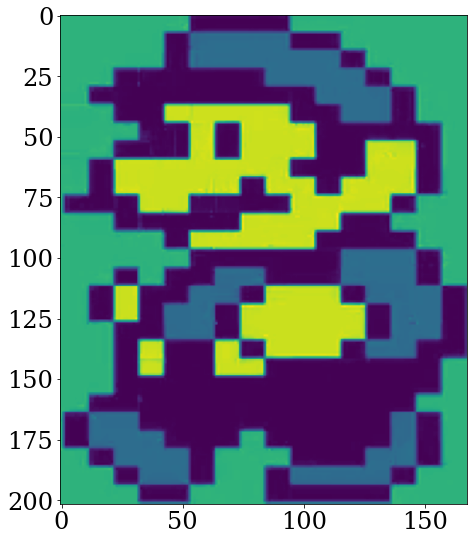

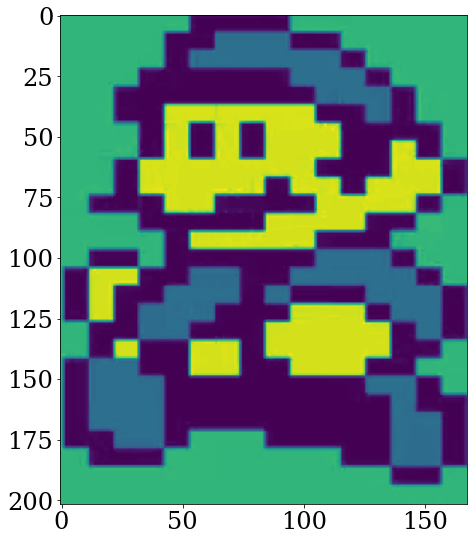

In [82]:
for img in frames:
    plt.imshow(img)
    plt.show()

In [83]:
frames_np = np.array(frames)

In [84]:
frames_np.shape

(50, 202, 168)

In [85]:
len(frames)

50

In [86]:
frames_prep = frames_np.reshape((50, 202*168))

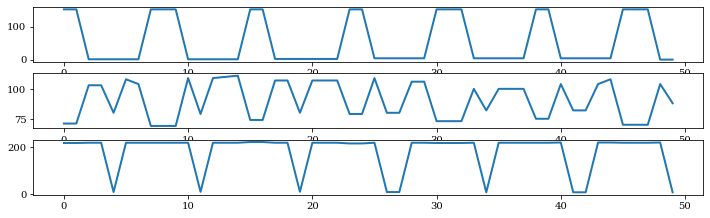

In [114]:
from random import randint

plt.rcParams['figure.figsize']=(12,12)
plt.rcParams['font.size']= 30

plt.rcParams['font.family'] = 'DejaVu Serif'
plt.rcParams['lines.linewidth'] = 2
plt.rcParams['lines.markersize'] = 12
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
plt.rcParams['legend.fontsize'] = 24
plt.rcParams['axes.titlesize'] = 36
plt.rcParams['axes.labelsize'] = 24

for n in range(3):
    i = randint(0, 201)
    j = randint(0, 167)
    plt.subplot(10, 1, n+1)
    plt.plot(frames_np[:, i, j])
plt.savefig('./figs/example_series_mario.png')
plt.show()

In [142]:
frames_prep.shape

(50, 33936)

In [166]:
from pyts.decomposition import SingularSpectrumAnalysis

groups = 3
L = 10
alg_2 = SingularSpectrumAnalysis(L, groups)
alg_2.fit(frames_prep)
res = alg_2.transform(frames_prep)

In [167]:
res.shape

(50, 3, 33936)

<IPython.core.display.Javascript object>


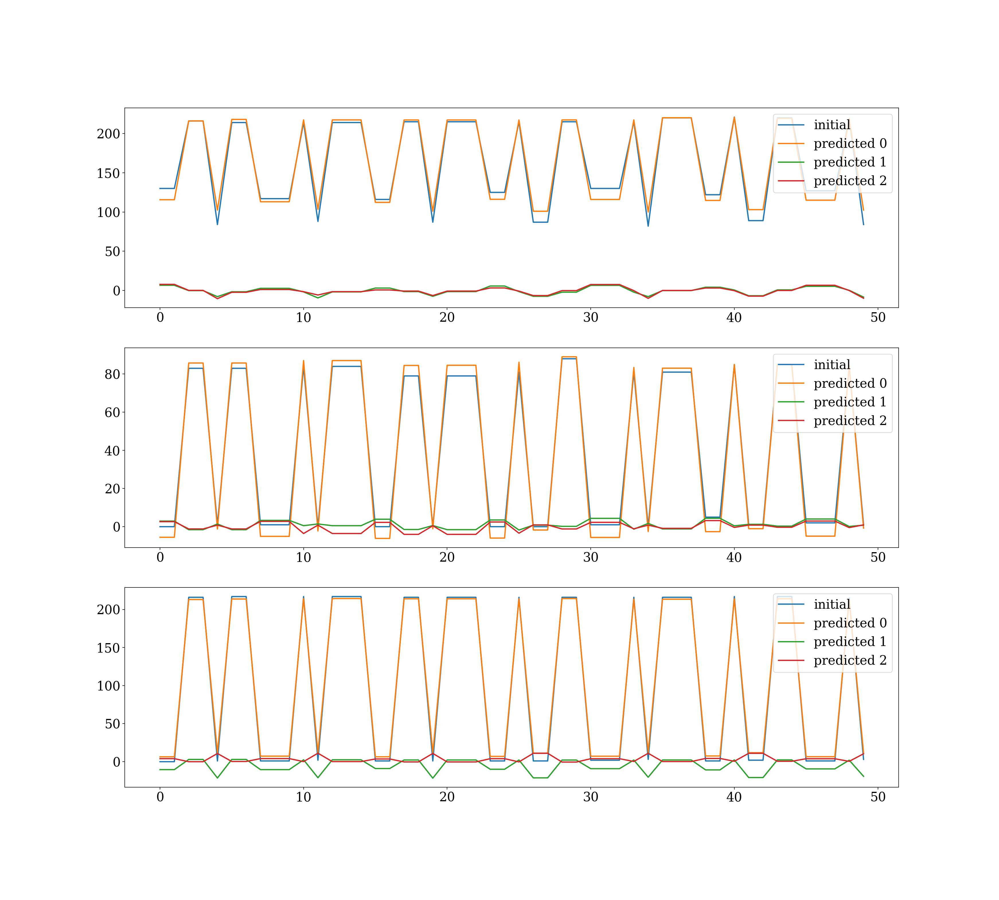

In [169]:
preds = np.zeros_like(frames_prep)

plt.rcParams['figure.figsize']=(10,9)
plt.rcParams['font.size']= 30

plt.rcParams['font.family'] = 'DejaVu Serif'
plt.rcParams['lines.linewidth'] = 2
plt.rcParams['lines.markersize'] = 12
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['legend.fontsize'] = 20
plt.rcParams['axes.titlesize'] = 36
plt.rcParams['axes.labelsize'] = 24

for i in range(3):
    k = randint(0, 201)
    l = randint(0, 167)
    plt.subplot(3, 1, i+1)
    plt.plot(frames_prep[:, k*l], label='initial')
#     plt.plot(pred[:, i], label='predicted')
    pred = np.zeros_like(res[:, 0, k*l])
    for j in range(3):
        plt.plot(res[:, j, k*l], label='predicted {}'.format(j))
        pred += res[:, j, k*l]
#     plt.plot(pred, label='predicted')
    preds[:, k*l] = pred
#     plt.plot(res[i, :], label='predicted')
    plt.legend(loc='upper right')
plt.savefig('ssa_mario.pdf')
plt.show()
    


# preds = np.zeros_like(video_reshaped)
# for i in range(4):
#     plt.subplot(10, 1, i+1)
#     plt.plot(video_reshaped[:, i], label='initial')
# #     plt.plot(pred[:, i], label='predicted')
#     pred = np.zeros_like(res[i, 0, :])
#     for j in range(3):
#         plt.plot(res[i, j, :], label='predicted {}'.format(j))
#         pred += res[i, j, :]
# #     plt.plot(pred, label='predicted')
#     preds[:, i] = pred
# #     plt.plot(res[i, :], label='predicted')
#     plt.legend(loc='upper right')
# plt.savefig('ssa_base.pdf')
# plt.show()

In [170]:
L = 9
N = frames_prep.shape[0]-L+1
# traj_tensor = np.zeros((2, 2, N, L))
traj_tensor = np.zeros((202*168, N, L))

# for i in range(2):
#     for j in range(2):
#         series = video[:, i, j]
#         traj_matr = np.zeros((N, L))
#         for n in range(N):
#             traj_matr[n] = series[n:n+L]
#         traj_tensor[i, j] = traj_matr

for i in range(traj_tensor.shape[0]):
    series = frames_prep[:, i]
    traj_matr = np.zeros((N, L))
    for n in range(N):
        traj_matr[n] = series[n:n+L]
    traj_tensor[i] = traj_matr

In [171]:
tensor = Tensor(traj_tensor)

In [172]:
traj_tensor.shape

(33936, 42, 9)

In [173]:
alg = HOSVD()

# ml_rank = (2, 2, 37, 4)
# ml_rank = (1, 1, 1, 1)
ml_rank = (3, 3, 3)
tensor_tkd_hosvd = alg.decompose(tensor, ml_rank)
print("\tOutput of the {} algorithm:".format(alg.name))
print(tensor_tkd_hosvd)

print('\n\tFactor matrices')
for mode, fmat in enumerate(tensor_tkd_hosvd.fmat):
    print('Mode-{} factor matrix is of shape {}'.format(mode, fmat.shape))
    
print('\n\tCore tensor')
print(tensor_tkd_hosvd.core)

	Output of the HOSVD algorithm:
Tucker representation of a tensor with multi-linear rank=(3, 3, 3).
Factor matrices represent properties: ['mode-0', 'mode-1', 'mode-2']
With corresponding latent components described by (33936, 42, 9) features respectively.

	Factor matrices
Mode-0 factor matrix is of shape (33936, 3)
Mode-1 factor matrix is of shape (42, 3)
Mode-2 factor matrix is of shape (9, 3)

	Core tensor
This tensor is of order 3 and consists of 27 elements.
Sizes and names of its modes are (3, 3, 3) and ['mode-0', 'mode-1', 'mode-2'] respectively.


In [174]:
residual_rel_error(tensor, tensor_tkd_hosvd)

0.3090172629897213

In [175]:
data = tensor_tkd_hosvd.reconstruct()
data = data.data

In [ ]:
%matplotlib notebook

fig = plt.figure(figsize=(20, 20))
ax = plt.axes(projection='3d')

# ax.plot3D(par1, par2, np.array(val) * 1.5, linewidth=6, label='Metaparameter optimization', alpha=0.5)
# ax.plot3D([par1_[0], par1_[0]+0.0001], [par2_[0], par2_[0]+0.0001], 
#           [val_[0], val_[0]+0.0001], linewidth=6.5, 
#           label='Metaprameter prediction', color='tab:orange', ls='--')

# for i in range(2):
#     for j in range(2):
#         ax.scatter3D(data[i, j, :, 0], data[i, j, :, 1], data[i, j, :, 3], 
#                      label='{}, {}'.format(i, j))

# for i in range(4):
#     if i % 2 == 0:
#         ax.scatter3D(data[i, :, 0], data[i, :, 1], data[i, :, 2], 
#                      label='{}'.format(i), marker='o')
#         ax.plot(data[i, :, 0], data[i, :, 1], data[i, :, 2], alpha=0.3)
#     else:
#         ax.scatter3D(data[i, :, 1], data[i, :, 2], data[i, :, 3], 
#              label='{}'.format(i), marker='o')
#         ax.plot(data[i, :, 1], data[i, :, 2], data[i, :, 3], alpha=0.3)

for i in range(data.shape[0]):
        ax.scatter3D(data[i, :, 1], data[i, :, 2], data[i, :, 3], 
                     label='{}'.format(i), marker='o', color='tab:blue')
        ax.plot(data[i, :, 1], data[i, :, 2], data[i, :, 3], alpha=0.3, color='tab:blue')

# ax.legend(loc='best')
ax.set_yticklabels([])
ax.set_xticklabels([])
ax.set_zticklabels([])
# plt.savefig('./figs/trajectory.pdf')
plt.show()

In [ ]:
%matplotlib notebook

fig = plt.figure(figsize=(20, 20))
ax = plt.axes(projection='3d')

# ax.plot3D(par1, par2, np.array(val) * 1.5, linewidth=6, label='Metaparameter optimization', alpha=0.5)
# ax.plot3D([par1_[0], par1_[0]+0.0001], [par2_[0], par2_[0]+0.0001], 
#           [val_[0], val_[0]+0.0001], linewidth=6.5, 
#           label='Metaprameter prediction', color='tab:orange', ls='--')

# for i in range(2):
#     for j in range(2):
#         ax.scatter3D(data[i, j, :, 0], data[i, j, :, 1], data[i, j, :, 3], 
#                      label='{}, {}'.format(i, j))

# for i in range(4):
#     if i % 2 == 0:
#         ax.scatter3D(data[i, :, 0], data[i, :, 1], data[i, :, 2], 
#                      label='{}'.format(i), marker='o')
#         ax.plot(data[i, :, 0], data[i, :, 1], data[i, :, 2], alpha=0.3)
#     else:
#         ax.scatter3D(data[i, :, 1], data[i, :, 2], data[i, :, 3], 
#              label='{}'.format(i), marker='o')
#         ax.plot(data[i, :, 1], data[i, :, 2], data[i, :, 3], alpha=0.3)

for i in range(100):
        ax.scatter3D(data[i, :, 1], data[i, :, 2], data[i, :, 3], 
                     label='{}'.format(i), marker='o', color='tab:blue')
        ax.plot(data[i, :, 1], data[i, :, 2], data[i, :, 3], alpha=0.3, color='tab:blue')

# ax.legend(loc='best')
ax.set_yticklabels([])
ax.set_xticklabels([])
ax.set_zticklabels([])
# plt.savefig('./figs/trajectory.pdf')
plt.show()

In [ ]:
%matplotlib notebook

fig = plt.figure(figsize=(20, 20))
ax = plt.axes(projection='3d')

# ax.plot3D(par1, par2, np.array(val) * 1.5, linewidth=6, label='Metaparameter optimization', alpha=0.5)
# ax.plot3D([par1_[0], par1_[0]+0.0001], [par2_[0], par2_[0]+0.0001], 
#           [val_[0], val_[0]+0.0001], linewidth=6.5, 
#           label='Metaprameter prediction', color='tab:orange', ls='--')

# for i in range(2):
#     for j in range(2):
#         ax.scatter3D(data[i, j, :, 0], data[i, j, :, 1], data[i, j, :, 3], 
#                      label='{}, {}'.format(i, j))

# for i in range(4):
#     if i % 2 == 0:
#         ax.scatter3D(data[i, :, 0], data[i, :, 1], data[i, :, 2], 
#                      label='{}'.format(i), marker='o')
#         ax.plot(data[i, :, 0], data[i, :, 1], data[i, :, 2], alpha=0.3)
#     else:
#         ax.scatter3D(data[i, :, 1], data[i, :, 2], data[i, :, 3], 
#              label='{}'.format(i), marker='o')
#         ax.plot(data[i, :, 1], data[i, :, 2], data[i, :, 3], alpha=0.3)


for i in range(1000):
        ax.scatter3D(data[i, :, 1], data[i, :, 2], data[i, :, 3], 
                     label='{}'.format(i), marker='o', color='tab:blue')
        ax.plot(data[i, :, 1], data[i, :, 2], data[i, :, 3], alpha=0.3, color='tab:blue')

# ax.legend(loc='best')
ax.set_yticklabels([])
ax.set_xticklabels([])
ax.set_zticklabels([])
# plt.savefig('./figs/trajectory.pdf')
plt.show()

In [ ]:
%matplotlib notebook

fig = plt.figure(figsize=(20, 20))
ax = plt.axes(projection='3d')

# ax.plot3D(par1, par2, np.array(val) * 1.5, linewidth=6, label='Metaparameter optimization', alpha=0.5)
# ax.plot3D([par1_[0], par1_[0]+0.0001], [par2_[0], par2_[0]+0.0001], 
#           [val_[0], val_[0]+0.0001], linewidth=6.5, 
#           label='Metaprameter prediction', color='tab:orange', ls='--')

# for i in range(2):
#     for j in range(2):
#         ax.scatter3D(data[i, j, :, 0], data[i, j, :, 1], data[i, j, :, 3], 
#                      label='{}, {}'.format(i, j))

# for i in range(4):
#     if i % 2 == 0:
#         ax.scatter3D(data[i, :, 0], data[i, :, 1], data[i, :, 2], 
#                      label='{}'.format(i), marker='o')
#         ax.plot(data[i, :, 0], data[i, :, 1], data[i, :, 2], alpha=0.3)
#     else:
#         ax.scatter3D(data[i, :, 1], data[i, :, 2], data[i, :, 3], 
#              label='{}'.format(i), marker='o')
#         ax.plot(data[i, :, 1], data[i, :, 2], data[i, :, 3], alpha=0.3)


for i in range(3001, 4000):
        ax.scatter3D(data[i, :, 1], data[i, :, 2], data[i, :, 3], 
                     label='{}'.format(i), marker='o', color='tab:blue')
        ax.plot(data[i, :, 1], data[i, :, 2], data[i, :, 3], alpha=0.1, color='tab:blue')

# ax.legend(loc='best')
ax.set_yticklabels([])
ax.set_xticklabels([])
ax.set_zticklabels([])
# plt.savefig('./figs/trajectory.pdf')
plt.show()

In [ ]:
%matplotlib notebook

fig = plt.figure(figsize=(20, 20))
ax = plt.axes(projection='3d')

# ax.plot3D(par1, par2, np.array(val) * 1.5, linewidth=6, label='Metaparameter optimization', alpha=0.5)
# ax.plot3D([par1_[0], par1_[0]+0.0001], [par2_[0], par2_[0]+0.0001], 
#           [val_[0], val_[0]+0.0001], linewidth=6.5, 
#           label='Metaprameter prediction', color='tab:orange', ls='--')

# for i in range(2):
#     for j in range(2):
#         ax.scatter3D(data[i, j, :, 0], data[i, j, :, 1], data[i, j, :, 3], 
#                      label='{}, {}'.format(i, j))

# for i in range(4):
#     if i % 2 == 0:
#         ax.scatter3D(data[i, :, 0], data[i, :, 1], data[i, :, 2], 
#                      label='{}'.format(i), marker='o')
#         ax.plot(data[i, :, 0], data[i, :, 1], data[i, :, 2], alpha=0.3)
#     else:
#         ax.scatter3D(data[i, :, 1], data[i, :, 2], data[i, :, 3], 
#              label='{}'.format(i), marker='o')
#         ax.plot(data[i, :, 1], data[i, :, 2], data[i, :, 3], alpha=0.3)


for i in range(32001, 33000):
        ax.scatter3D(data[i, :, 1], data[i, :, 2], data[i, :, 3], 
                     label='{}'.format(i), marker='o', color='tab:blue')
        ax.plot(data[i, :, 1], data[i, :, 2], data[i, :, 3], alpha=0.1, color='tab:blue')

# ax.legend(loc='best')
ax.set_yticklabels([])
ax.set_xticklabels([])
ax.set_zticklabels([])
# plt.savefig('./figs/trajectory.pdf')
plt.show()

<IPython.core.display.Javascript object>


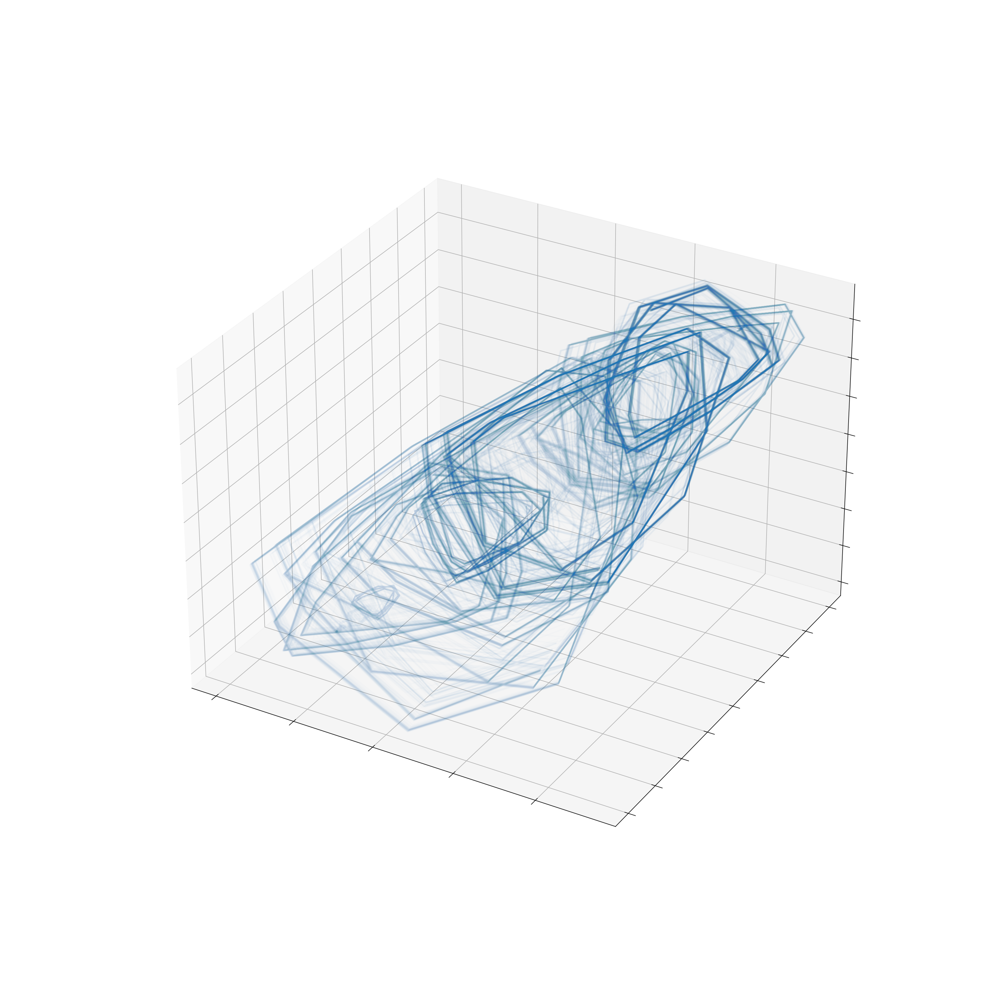

In [178]:
%matplotlib notebook

fig = plt.figure(figsize=(20, 20))
ax = plt.axes(projection='3d')

# ax.plot3D(par1, par2, np.array(val) * 1.5, linewidth=6, label='Metaparameter optimization', alpha=0.5)
# ax.plot3D([par1_[0], par1_[0]+0.0001], [par2_[0], par2_[0]+0.0001], 
#           [val_[0], val_[0]+0.0001], linewidth=6.5, 
#           label='Metaprameter prediction', color='tab:orange', ls='--')

# for i in range(2):
#     for j in range(2):
#         ax.scatter3D(data[i, j, :, 0], data[i, j, :, 1], data[i, j, :, 3], 
#                      label='{}, {}'.format(i, j))

# for i in range(4):
#     if i % 2 == 0:
#         ax.scatter3D(data[i, :, 0], data[i, :, 1], data[i, :, 2], 
#                      label='{}'.format(i), marker='o')
#         ax.plot(data[i, :, 0], data[i, :, 1], data[i, :, 2], alpha=0.3)
#     else:
#         ax.scatter3D(data[i, :, 1], data[i, :, 2], data[i, :, 3], 
#              label='{}'.format(i), marker='o')
#         ax.plot(data[i, :, 1], data[i, :, 2], data[i, :, 3], alpha=0.3)


for i in range(30001, 31000):
#         ax.scatter3D(data[i, :, 1], data[i, :, 2], data[i, :, 3], 
#                      label='{}'.format(i), marker='o', color='tab:blue')
        ax.plot(data[i, :, 1], data[i, :, 2], data[i, :, 3], alpha=0.01, color='tab:blue')

# ax.legend(loc='best')
ax.set_yticklabels([])
ax.set_xticklabels([])
ax.set_zticklabels([])
plt.savefig('./figs/mario_trajectory.pdf')
plt.show()

In [187]:
interpr = frames_prep.copy()

for i in range(30001, 31000):
    interpr[:, i] = np.ones_like(interpr[:, i])*255

In [188]:
interpr = interpr.reshape(50, 202, 168)

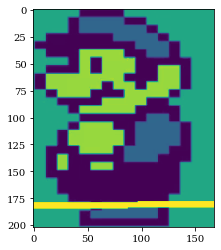

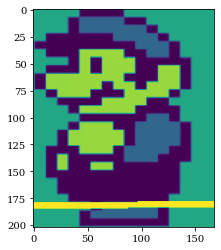

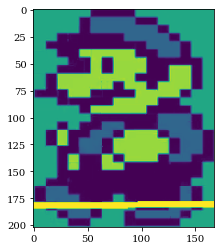

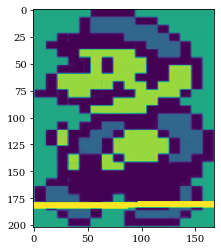

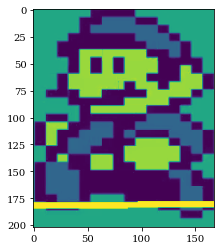

...

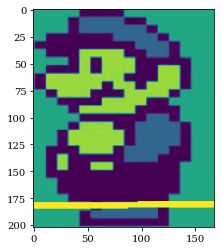

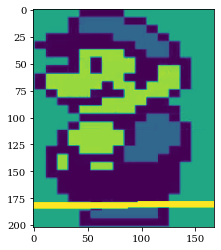

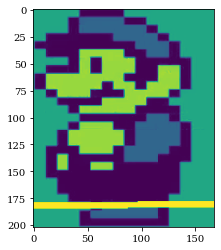

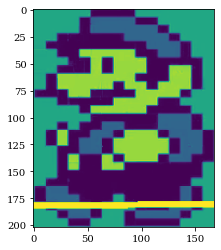

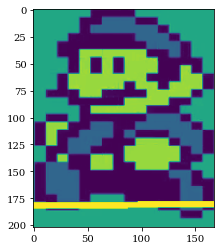

In [189]:
%matplotlib inline

for img in interpr:
    plt.imshow(img)
    plt.show()

<IPython.core.display.Javascript object>


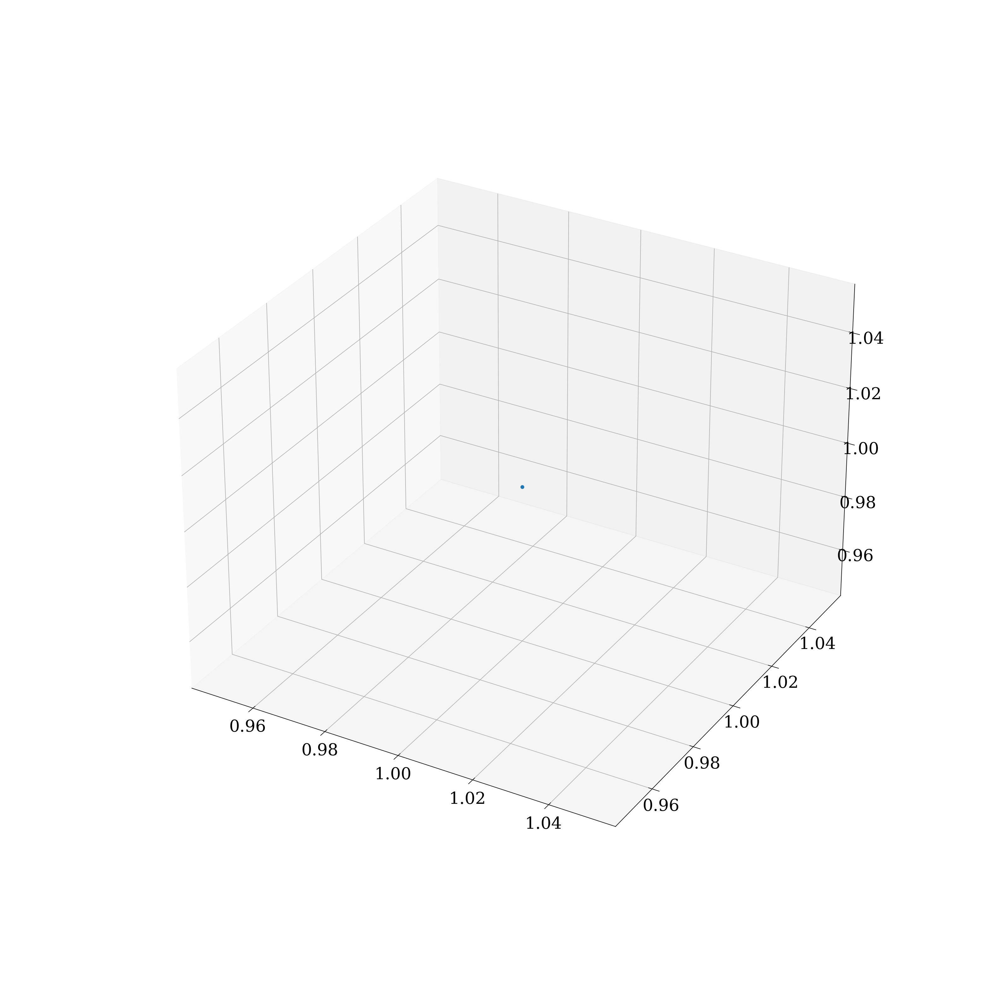

In [134]:
%matplotlib notebook

fig = plt.figure(figsize=(20, 20))
ax = plt.axes(projection='3d')
ax.scatter3D(1, 1, 1)

plt.show()